In [2]:
# Applied Data Science with Python - Assement 1, Feature Engineering by Danny Mathieson

In [3]:
## Initialize packages, import data
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

In [4]:
### import csv into a dataframe
df = pd.read_csv('datasets/feature_engineering_data.csv')

In [5]:
## Question 1: Understanding the dataset

In [6]:
### Question 1-a: Identify shape of the data set
print(df.shape)

(1460, 81)


In [7]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [8]:
### Question 1-b: Identify variables with null values
df_na_count = df.isna().sum()
print(df_na_count[df_na_count > 0].sort_values(ascending=False))

PoolQC          1453
MiscFeature     1406
Alley           1369
Fence           1179
FireplaceQu      690
LotFrontage      259
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
BsmtExposure      38
BsmtFinType2      38
BsmtFinType1      37
BsmtCond          37
BsmtQual          37
MasVnrArea         8
MasVnrType         8
Electrical         1
dtype: int64


In [9]:
### Question 1-c: Identify variables with unique values
for c in df.columns:
    print(f'{c}:\t{100-round(df[c].dropna().nunique()/df[c].dropna().count()*100.0,1)}% unique')

Id:	0.0% unique
MSSubClass:	99.0% unique
MSZoning:	99.7% unique
LotFrontage:	90.8% unique
LotArea:	26.5% unique
Street:	99.9% unique
Alley:	97.8% unique
LotShape:	99.7% unique
LandContour:	99.7% unique
Utilities:	99.9% unique
LotConfig:	99.7% unique
LandSlope:	99.8% unique
Neighborhood:	98.3% unique
Condition1:	99.4% unique
Condition2:	99.5% unique
BldgType:	99.7% unique
HouseStyle:	99.5% unique
OverallQual:	99.3% unique
OverallCond:	99.4% unique
YearBuilt:	92.3% unique
YearRemodAdd:	95.8% unique
RoofStyle:	99.6% unique
RoofMatl:	99.5% unique
Exterior1st:	99.0% unique
Exterior2nd:	98.9% unique
MasVnrType:	99.7% unique
MasVnrArea:	77.5% unique
ExterQual:	99.7% unique
ExterCond:	99.7% unique
Foundation:	99.6% unique
BsmtQual:	99.7% unique
BsmtCond:	99.7% unique
BsmtExposure:	99.7% unique
BsmtFinType1:	99.6% unique
BsmtFinSF1:	56.4% unique
BsmtFinType2:	99.6% unique
BsmtFinSF2:	90.1% unique
BsmtUnfSF:	46.6% unique
TotalBsmtSF:	50.6% unique
Heating:	99.6% unique
HeatingQC:	99.7% unique
Cen

In [10]:
## Question 2: Generate a seaparate dataset for numerical and categorical variables
num_df = df.select_dtypes(include=['int64','float64'])
cat_df = df.select_dtypes(exclude=['int64','float64'])
#### include the house sale price in the cat_df for further analysis
cat_df = cat_df.merge(df['SalePrice'], how='left', left_index=True, right_index=True)
print(num_df)
print(cat_df)

        Id  MSSubClass  LotFrontage  LotArea  OverallQual  OverallCond  \
0        1          60         65.0     8450            7            5   
1        2          20         80.0     9600            6            8   
2        3          60         68.0    11250            7            5   
3        4          70         60.0     9550            7            5   
4        5          60         84.0    14260            8            5   
...    ...         ...          ...      ...          ...          ...   
1455  1456          60         62.0     7917            6            5   
1456  1457          20         85.0    13175            6            6   
1457  1458          70         66.0     9042            7            9   
1458  1459          20         68.0     9717            5            6   
1459  1460          20         75.0     9937            5            6   

      YearBuilt  YearRemodAdd  MasVnrArea  BsmtFinSF1  ...  WoodDeckSF  \
0          2003          2003       1

In [11]:
## Question 3: EDA of numerical values

In [12]:
### Question 3-a: Missing value treatment
num_df_na_count = num_df.isna().sum()
print(num_df_na_count[num_df_na_count > 0].sort_values(ascending=False))

LotFrontage    259
GarageYrBlt     81
MasVnrArea       8
dtype: int64


LotFrontage:
count    1201.000000
mean       70.049958
std        24.284752
min        21.000000
25%        59.000000
50%        69.000000
75%        80.000000
max       313.000000
Name: LotFrontage, dtype: float64
GarageYrBlt:
count    1379.000000
mean     1978.506164
std        24.689725
min      1900.000000
25%      1961.000000
50%      1980.000000
75%      2002.000000
max      2010.000000
Name: GarageYrBlt, dtype: float64
MasVnrArea:
count    1452.000000
mean      103.685262
std       181.066207
min         0.000000
25%         0.000000
50%         0.000000
75%       166.000000
max      1600.000000
Name: MasVnrArea, dtype: float64


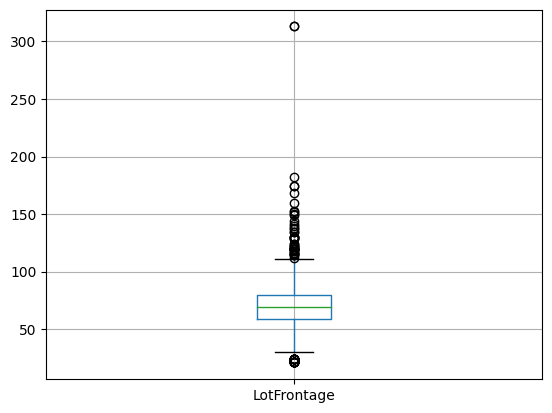

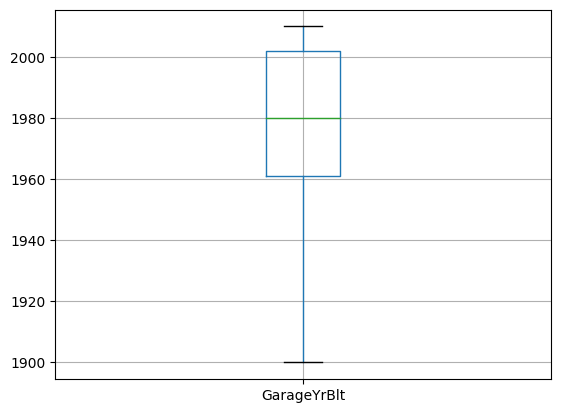

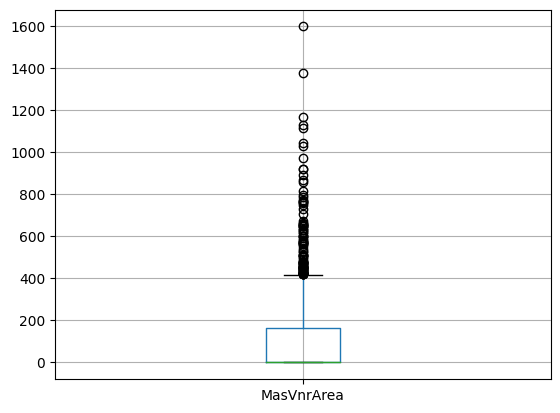

In [13]:
#### 3 numerical variables with missing values: LotFrontage, GarageYrBlt, MasVnrArea
#### Check each variables mean and median and determine if we should impute mean, median, or some other arbitrary value
num_df_na = num_df[['LotFrontage','GarageYrBlt','MasVnrArea']]
for c in num_df_na.columns:
    print(f'{c}:\n{num_df_na[c].describe()}')
    plt.figure()
    num_df_na.boxplot([c])

/var/folders/r7/dtjny68152z02rjhb55rxv300000gn/T/ipykernel_94375/1411405850.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  num_df_na[['LotFrontage','MasVnrArea']] = num_df_na[['LotFrontage','MasVnrArea']].fillna(0)
/var/folders/r7/dtjny68152z02rjhb55rxv300000gn/T/ipykernel_94375/1411405850.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  num_df_na[['GarageYrBlt']] = median_imputer.transform(num_df_na[['GarageYrBlt']])


LotFrontage:
count    1460.000000
mean       57.623288
std        34.664304
min         0.000000
25%        42.000000
50%        63.000000
75%        79.000000
max       313.000000
Name: LotFrontage, dtype: float64
GarageYrBlt:
count    1460.000000
mean     1978.589041
std        23.997022
min      1900.000000
25%      1962.000000
50%      1980.000000
75%      2001.000000
max      2010.000000
Name: GarageYrBlt, dtype: float64
MasVnrArea:
count    1460.000000
mean      103.117123
std       180.731373
min         0.000000
25%         0.000000
50%         0.000000
75%       164.250000
max      1600.000000
Name: MasVnrArea, dtype: float64


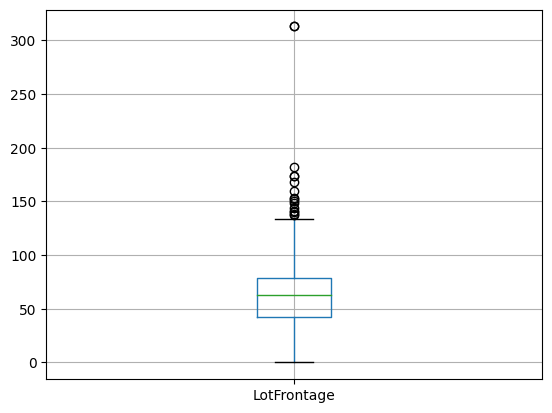

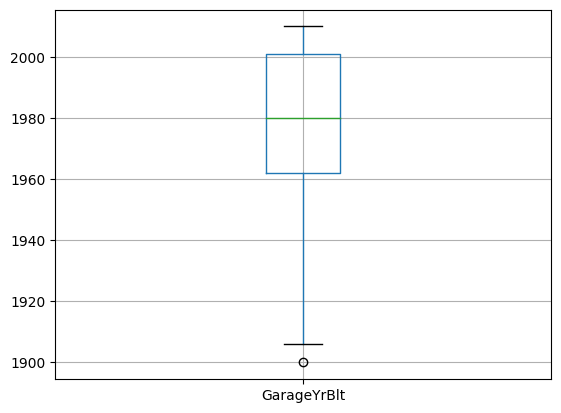

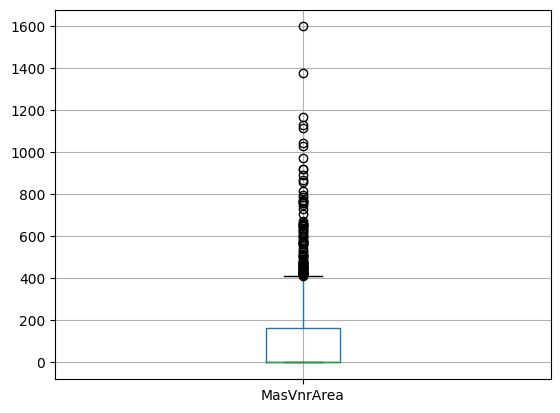

In [14]:
#### LotFrontage has a significant number of outliers and 0 within one standard devation of the mean --> NaN = 0
#### GarageYrBlt has mean and median near to each other, with a long tail towards the min --> NaN = median
#### MasVnrArea is very similar to LotFrontage with a lot of values at 0 --> NaN --> 0

num_df_na[['LotFrontage','MasVnrArea']] = num_df_na[['LotFrontage','MasVnrArea']].fillna(0)

from sklearn.impute import SimpleImputer
median_imputer = SimpleImputer(missing_values=np.nan, strategy='median')
median_imputer = median_imputer.fit(num_df_na[['GarageYrBlt']])
num_df_na[['GarageYrBlt']] = median_imputer.transform(num_df_na[['GarageYrBlt']])

for c in num_df_na.columns:
    print(f'{c}:\n{num_df_na[c].describe()}')
    plt.figure()
    num_df_na.boxplot([c])

In [15]:
#### And then we need to add the missing value treatment back into the original num_df
num_df[['LotFrontage','MasVnrArea']] = num_df[['LotFrontage','MasVnrArea']].fillna(0)
median_imputer = SimpleImputer(missing_values=np.nan, strategy='median')
median_imputer = median_imputer.fit(num_df[['GarageYrBlt']])
num_df[['GarageYrBlt']] = median_imputer.transform(num_df[['GarageYrBlt']])

num_df_na_count = num_df.isna().sum()
print(num_df_na_count[num_df_na_count > 0].sort_values(ascending=False))

#### and the original df as well
df[['LotFrontage','MasVnrArea']] = df[['LotFrontage','MasVnrArea']].fillna(0)
median_imputer = SimpleImputer(missing_values=np.nan, strategy='median')
median_imputer = median_imputer.fit(df[['GarageYrBlt']])
df[['GarageYrBlt']] = median_imputer.transform(df[['GarageYrBlt']])

Series([], dtype: int64)


In [16]:
### Question 3-b: Identify Skewness and Distribution
#### Skewness
num_df_skew = num_df.skew()
print(f'\nHighly Positive Skew:\n{num_df_skew[num_df_skew > 1].sort_values(ascending=False)}')
print(f'\nModerately Positive Skew:\n{num_df_skew[(num_df_skew <= 1) & (num_df_skew > 0.5)].sort_values(ascending=False)}')
print(f'\nSymmetrical:\n{num_df_skew[(num_df_skew <= 0.5) & (num_df_skew >= -0.5)].sort_values(ascending=False)}')
print(f'\nModerately Negative Skew:\n{num_df_skew[(num_df_skew >= -1) & (num_df_skew < -0.5)].sort_values()}')
print(f'\nHighly Negative Skew:\n{num_df_skew[num_df_skew < -1].sort_values()}')


Highly Positive Skew:
MiscVal          24.476794
PoolArea         14.828374
LotArea          12.207688
3SsnPorch        10.304342
LowQualFinSF      9.011341
KitchebvGr        4.488397
BsmtFinSF2        4.255261
ScreenPorch       4.122214
BsmtHalfBath      4.103403
EnclosedPorch     3.089872
MasVnrArea        2.677616
OpenPorchSF       2.364342
SalePrice         1.882876
BsmtFinSF1        1.685503
WoodDeckSF        1.541376
TotalBsmtSF       1.524255
MSSubClass        1.407657
1stFlrSF          1.376757
GrLivArea         1.366560
dtype: float64

Moderately Positive Skew:
BsmtUnfSF       0.920268
2ndFlrSF        0.813030
OverallCond     0.693067
TotRmsAbvGrd    0.676341
HalfBath        0.675897
Fireplaces      0.649565
BsmtFullBath    0.596067
dtype: float64

Symmetrical:
LotFrontage     0.267822
OverallQual     0.216944
MoSold          0.212053
BedroomAbvGr    0.211790
GarageArea      0.179981
YrSold          0.096269
FullBath        0.036562
Id              0.000000
GarageCars     -0.

/var/folders/r7/dtjny68152z02rjhb55rxv300000gn/T/ipykernel_94375/2248354643.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax1, ax2) = plt.subplots(2)


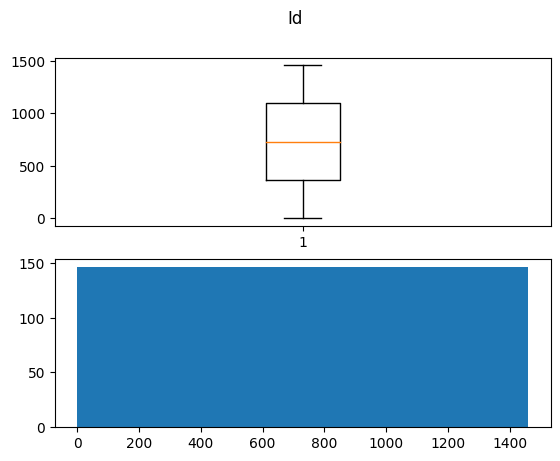

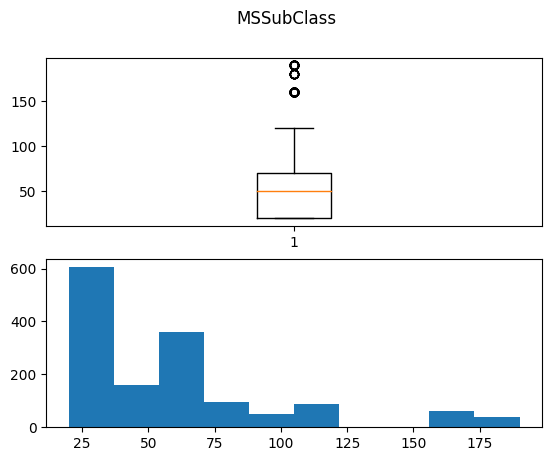

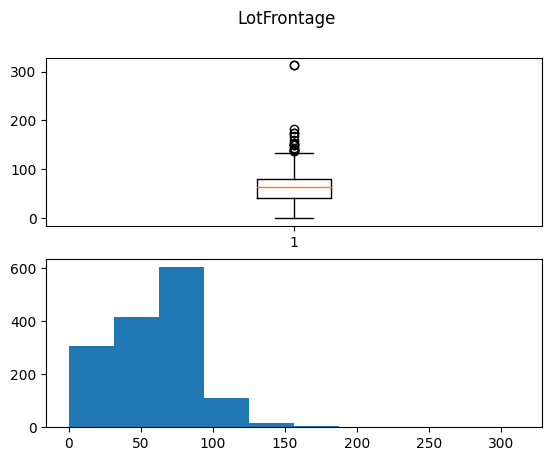

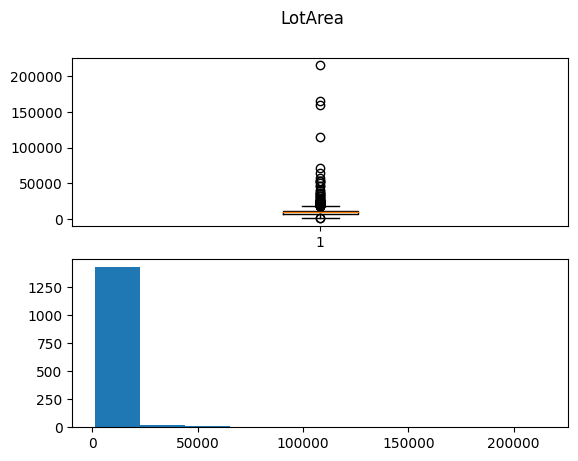

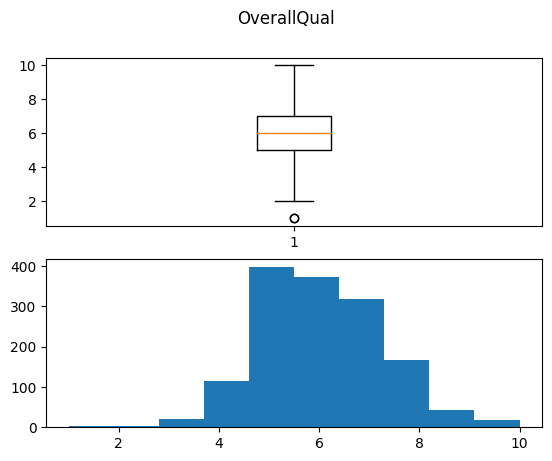

...

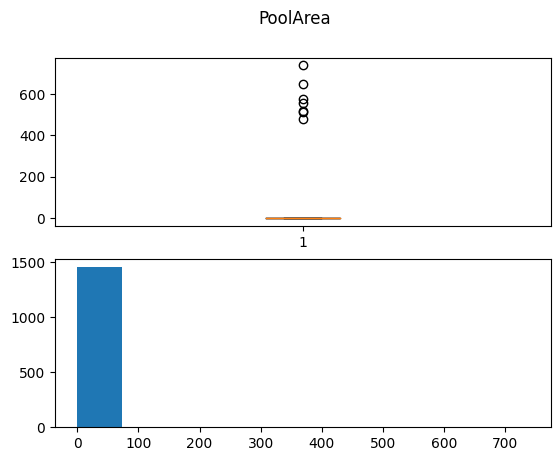

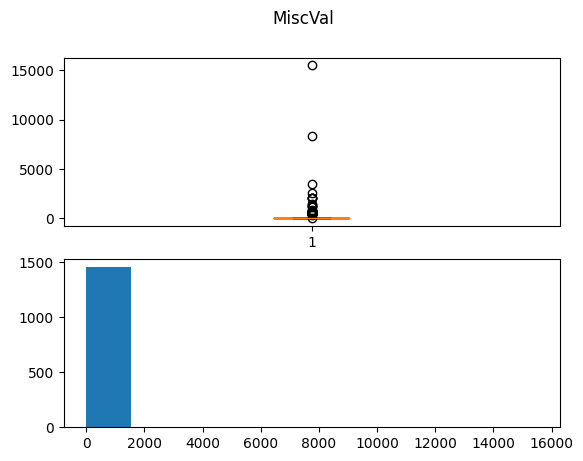

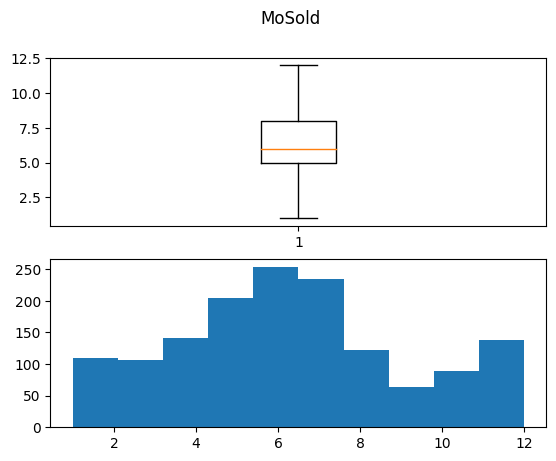

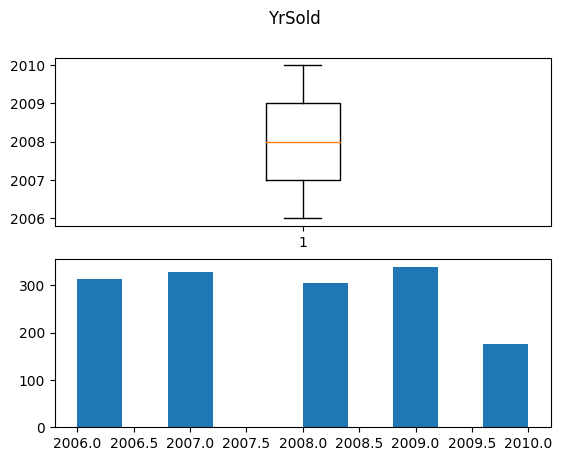

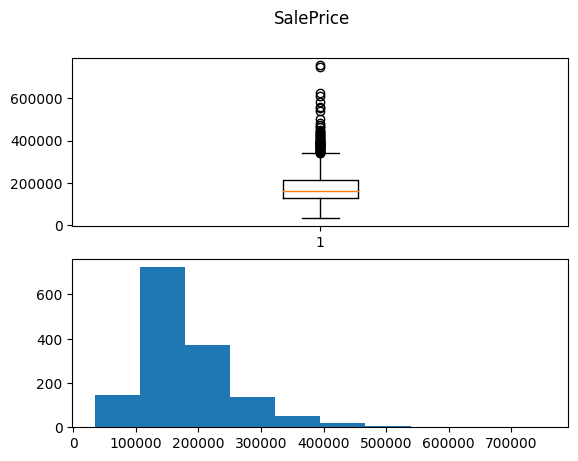

In [17]:
#### Distribution
for c in num_df.columns:
    fig, (ax1, ax2) = plt.subplots(2)
    fig.suptitle(c)
    ax1.boxplot(num_df[c])
    ax2.hist(num_df[c])

SalePrice        1.000000
OverallQual      0.790982
GrLivArea        0.708624
GarageCars       0.640409
GarageArea       0.623431
TotalBsmtSF      0.613581
1stFlrSF         0.605852
FullBath         0.560664
TotRmsAbvGrd     0.533723
YearBuilt        0.522897
YearRemodAdd     0.507101
MasVnrArea       0.472614
Fireplaces       0.466929
GarageYrBlt      0.466754
BsmtFinSF1       0.386420
WoodDeckSF       0.324413
2ndFlrSF         0.319334
OpenPorchSF      0.315856
HalfBath         0.284108
LotArea          0.263843
BsmtFullBath     0.227122
BsmtUnfSF        0.214479
LotFrontage      0.209624
BedroomAbvGr     0.168213
ScreenPorch      0.111447
PoolArea         0.092404
MoSold           0.046432
3SsnPorch        0.044584
BsmtFinSF2      -0.011378
BsmtHalfBath    -0.016844
MiscVal         -0.021190
Id              -0.021917
LowQualFinSF    -0.025606
YrSold          -0.028923
OverallCond     -0.077856
MSSubClass      -0.084284
EnclosedPorch   -0.128578
KitchebvGr      -0.135907
Name: SalePr

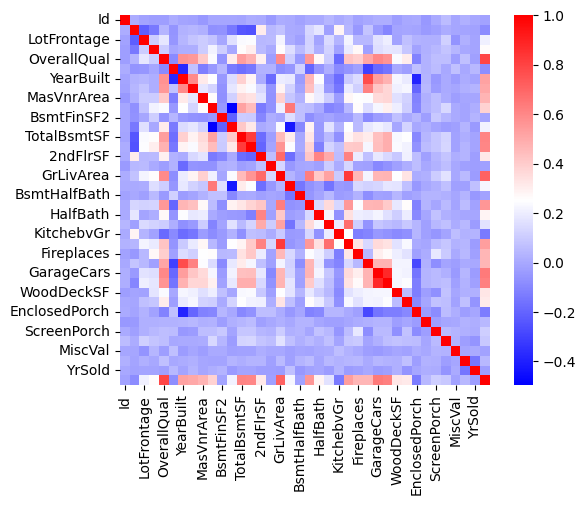

In [18]:
### Question 3-c: Identify significant varibles with correlation matrix
import seaborn as sns
num_df_corr = num_df.corr()
sns.heatmap(data=num_df_corr, square=True, cmap='bwr')
#### stack rank top correlations with SalePrice
corr_arr = num_df_corr['SalePrice']
print(corr_arr.sort_values(ascending=False))

#### store significant numerical variables for later (correlation >= 0.5)
significant_nums = list(corr_arr[corr_arr >= 0.5].index)

In [19]:
### Question 3-d: Pair plot for distribution and density
#### Tried it columnwise and it took forever.... Ended up with the crazy plot shown below
# for i in num_df.columns:
#     for j in num_df.columns:
#         if (i != j):
#             print(f'\n\n{i} x {j}')
#             sns.pairplot(num_df, vars=[i, j], hue='SalePrice')
#             plt.show()
sns.pairplot(num_df, hue='SalePrice')

In [20]:
## Question 4: EDA of categorical values

In [21]:
### Question 4-a: Missing Value Treatment
cat_df_na_count = cat_df.isna().sum()
print(cat_df_na_count[cat_df_na_count > 0].sort_values(ascending=False))
cat_df_na_cols = cat_df_na_count[cat_df_na_count > 0].index
for c in cat_df_na_cols:
    non_null_counts = cat_df[[c]].value_counts()
    null_count = cat_df_na_count[c]
    print(f'\n\n{c}\n{non_null_counts}\nNulls={null_count}')

PoolQC          1453
MiscFeature     1406
Alley           1369
Fence           1179
FireplaceQu      690
GarageType        81
GarageFinish      81
GarageQual        81
GarageCond        81
BsmtExposure      38
BsmtFinType2      38
BsmtQual          37
BsmtCond          37
BsmtFinType1      37
MasVnrType         8
Electrical         1
dtype: int64


Alley
Alley
Grvl     50
Pave     41
dtype: int64
Nulls=1369


MasVnrType
MasVnrType
None          864
BrkFace       445
Stone         128
BrkCmn         15
dtype: int64
Nulls=8


BsmtQual
BsmtQual
TA          649
Gd          618
Ex          121
Fa           35
dtype: int64
Nulls=37


BsmtCond
BsmtCond
TA          1311
Gd            65
Fa            45
Po             2
dtype: int64
Nulls=37


BsmtExposure
BsmtExposure
No              953
Av              221
Gd              134
Mn              114
dtype: int64
Nulls=38


BsmtFinType1
BsmtFinType1
Unf             430
GLQ             418
ALQ             220
BLQ             148
Rec             13

In [22]:
#### There seem to be 4 different reasons for nulls in the categorical variables

#### Reason 1: Categorical variable has a value for None, but wan't used in this case
cat_missing_masvnr = ['MasVnrType']

#### Reason 2: Categorical variable has a vast majority of null values, likely meaning the feature doesn't exist
cat_missing_alley = ['Alley']
cat_missing_fireplace = ['FireplaceQu']
cat_missing_pool = ['PoolQC']
cat_missing_fence = ['Fence']
cat_missing_misc = ['MiscFeature']

#### Reason 3: The house doesn't have a feature and multiple columns describe the feature
#### note one of these (BsmtExposure) has 38 nulls instead of expected 37
cat_missing_basement = ['BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2']
cat_missing_garage = ['GarageType','GarageFinish','GarageQual','GarageCond']

#### Reason 4: Very small number of missing values with a category that seems dominant
cat_missing_elec = ['Electrical']

#### For reasons 1, 2, & 3 we'll replaces NaN's with 'None'
#### For reason 3 we'll also create a boolean column for if the feature exists or not in the house
#### For reason 4 we'll assume that the NaN was a mistake and prescribe the most often occuring value in that place

#### add new boolean columns for reason 3 first
cat_df['HasBsmt'] = cat_df[cat_missing_basement].notnull().any(axis=1)
cat_df['HasGarage'] = cat_df[cat_missing_garage].notnull().any(axis=1)

#### replace NaN with the string 'None'
none_replacements = list(np.concatenate([cat_missing_masvnr,
                                         cat_missing_alley,
                                         cat_missing_fireplace,
                                         cat_missing_pool,
                                         cat_missing_fence,
                                         cat_missing_misc,
                                         cat_missing_basement,
                                         cat_missing_garage]
                                       ).flat)

cat_df[none_replacements] = cat_df[none_replacements].fillna('None')

#### fillna ont he electrical column
cat_df[cat_missing_elec] = cat_df[cat_missing_elec].fillna('SBrkr')

In [23]:
#### check for nulls - should return empty series
cat_df_na_count = cat_df.isna().sum()
print(cat_df_na_count[cat_df_na_count > 0].sort_values(ascending=False))
cat_df_na_cols = cat_df_na_count[cat_df_na_count > 0].index
for c in cat_df_na_cols:
    non_null_counts = cat_df[[c]].value_counts()
    null_count = cat_df_na_count[c]
    print(f'\n\n{c}\n{non_null_counts}\nNulls={null_count}')

#### apply missing values logic to original DF
df['HasBsmt'] = cat_df[cat_missing_basement].notnull().any(axis=1)
df['HasGarage'] = cat_df[cat_missing_garage].notnull().any(axis=1)
df[none_replacements] = cat_df[none_replacements].fillna('None')
df[cat_missing_elec] = cat_df[cat_missing_elec].fillna('SBrkr')

Series([], dtype: int64)


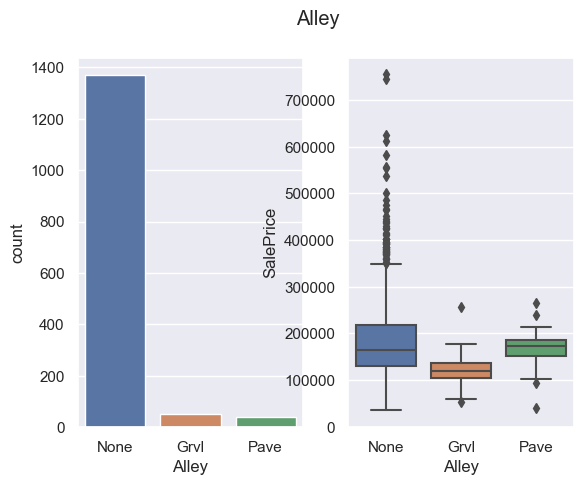

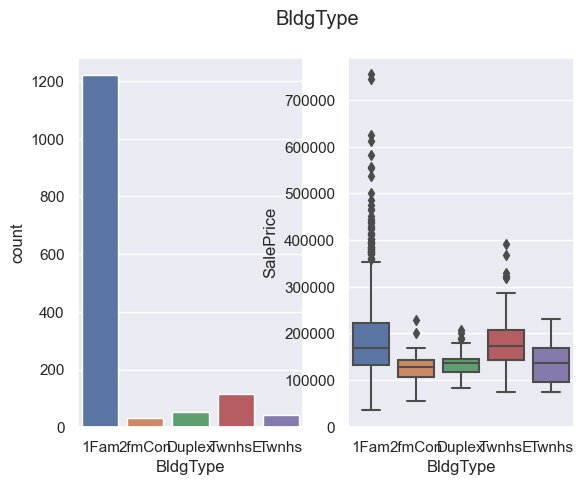

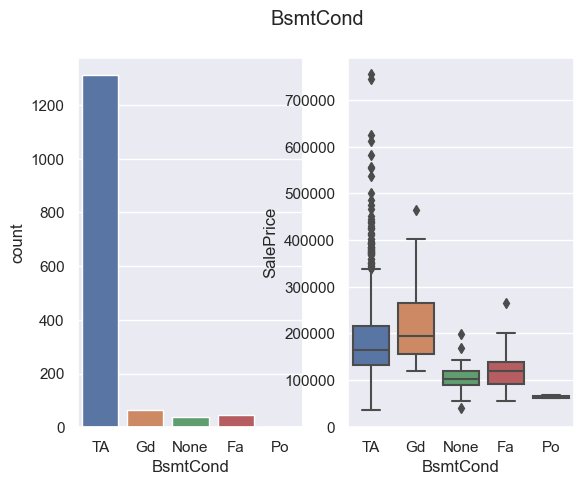

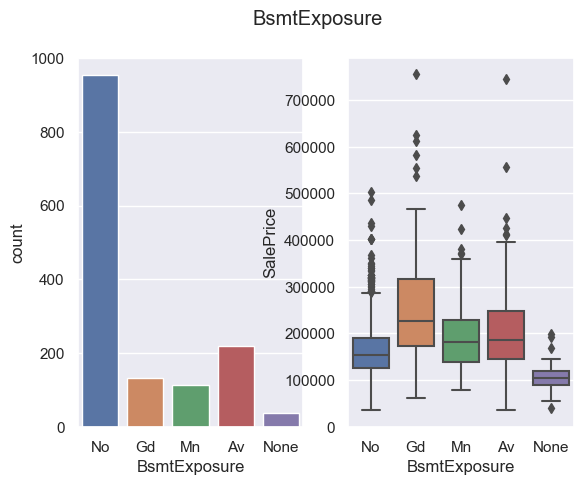

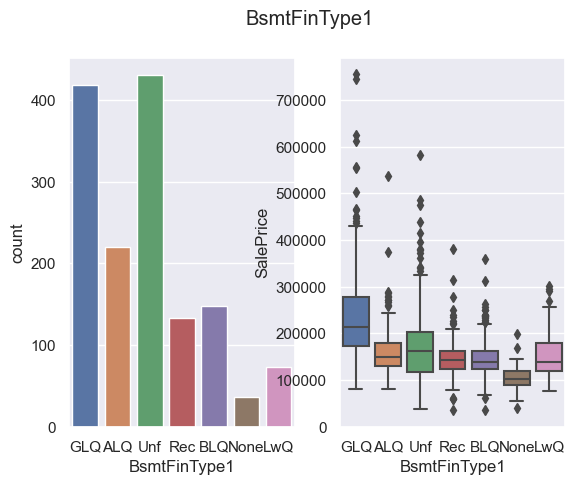

...

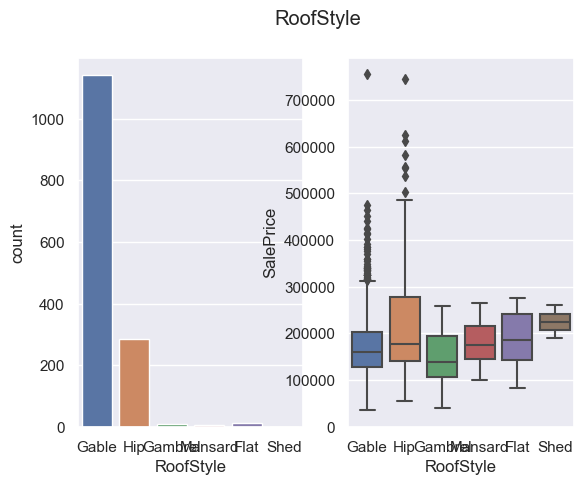

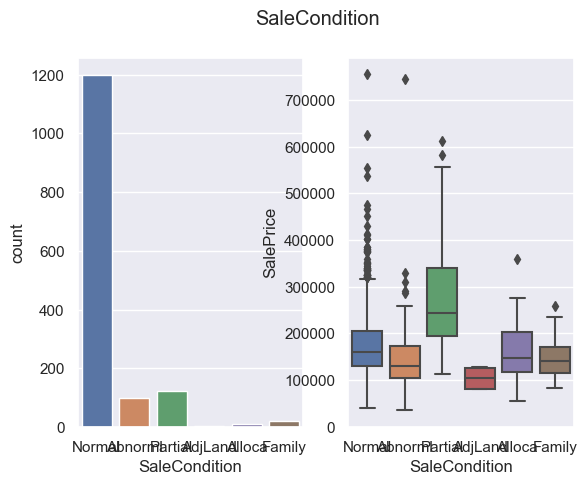

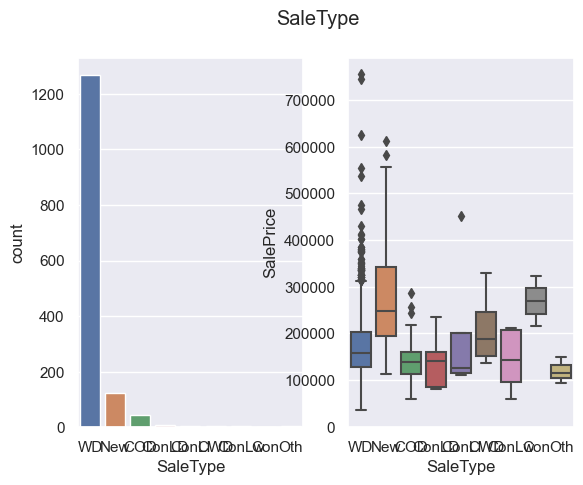

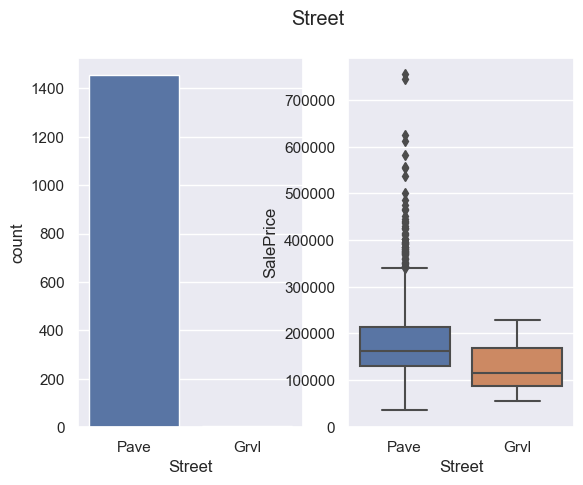

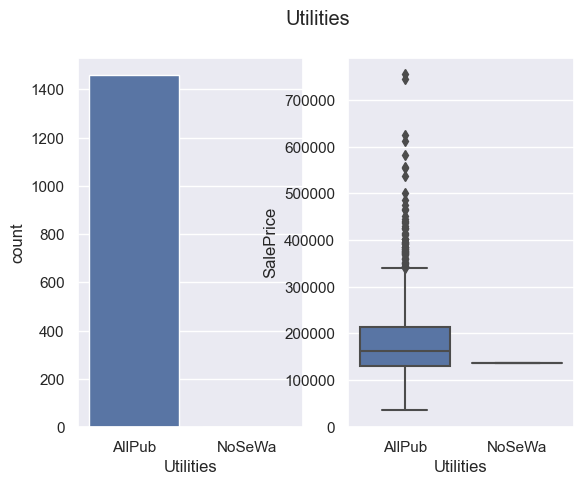

In [24]:
### Question 4-b: Count plot and box plot for bivariate analysis
sns.set()
for c in cat_df.columns.difference(['SalePrice']):
    fig, axs = plt.subplots(1,2)
    fig.suptitle(c)
    sns.countplot(x=c, data=cat_df, ax=axs[0])
    sns.boxplot(x=c, y='SalePrice', data=cat_df, ax=axs[1])
    plt.show()

In [ ]:
### Question 4-c: Identify Significant variables using p-values and chi-square values
#### p-values first
from scipy.stats import chi2_contingency

significant_cats = []

for col in cat_df.columns.difference(['SalePrice']):
    cat_contingency = pd.crosstab(cat_df[col], cat_df['SalePrice'])
    c, p, dof, expected = chi2_contingency(cat_contingency)
    sig = p < 0.05
    print(f'\n\n{col}:\tTest={c}, P={p}, significant={sig}')
    
    if sig:
        significant_cats.append(col)
        
print(f'\n\nSignificant Columns: {significant_cats}')

In [ ]:
## Question 5: Combine all the significant categorical and numerical variables

In [ ]:
#### filter orignial DF for significant columns - SalePrice is included in significant_nums
sig_columns = list(np.concatenate([significant_cats,significant_nums]).flat)
sig_df = df[sig_columns]
print(sig_df.describe())
print(sig_df.info())

In [ ]:
## Question 6: Plot box plot for the new dataset to find the variables with outliers

In [ ]:
for c in sig_df.columns.difference(['SalePrice']):
    if sig_df[c].dtype in ('int64','float64'):
        temp_df = sig_df[[c, 'SalePrice']]
        bin_count = min([8,sig_df[c].nunique()])
        temp_df[['Bins']] = temp_df[[c]].apply(pd.cut, bins=bin_count)
        sns.boxplot(data=temp_df, x='Bins', y='SalePrice')
    else:
        sns.boxplot(x=c, y='SalePrice', data=sig_df)
    plt.title(c)
    plt.show()